<a href="https://colab.research.google.com/github/mihirupadhyay/Tf_Gati_API/blob/main/tf_gati_api.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# kaggle dataset loading and api connection

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!mkdir -p /root/.kaggle
!cp /content/kaggle.json /root/.kaggle/

In [ ]:
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
! kaggle competitions download -c dog-breed-identification

100% 691M/691M [00:04<00:00, 178MB/s]
100% 691M/691M [00:04<00:00, 172MB/s]


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("tf_version", tf.__version__)
print("hub__version", hub.__version__)

tf_version 2.11.0
hub__version 0.12.0


In [ ]:
try:
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
if (tf.config.list_physical_devices ("GPU")):
  print("available gpu")
else:
  print("nopey nope")

nopey nope


In [ ]:
!unzip "/content/dog-breed-identification.zip" -d "/content/sample_data/Data_dog_vision"

Streaming output truncated to the last 5000 lines.
  inflating: /content/sample_data/Data_dog_vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/sample_data/Data_dog_vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  

In [ ]:
import pandas as pd
import numpy as np
labels_df = pd.read_csv("sample_data/Data_dog_vision/labels.csv")
labels_df.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [ ]:
labels_df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<AxesSubplot:>

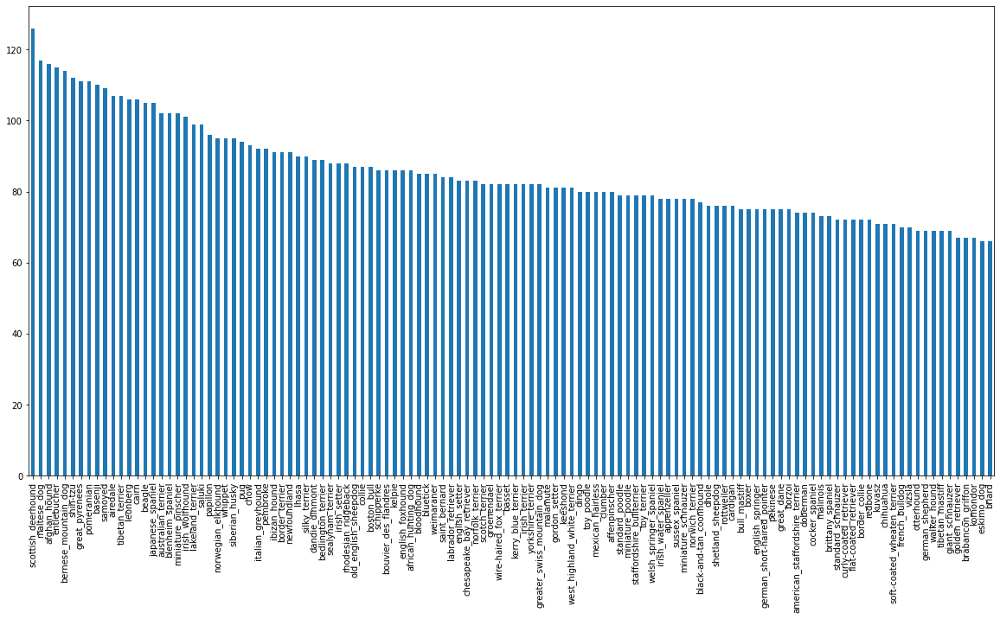

In [ ]:
labels_df["breed"].value_counts().plot.bar(figsize = (20, 10))

In [ ]:
labels_df["breed"].value_counts().median()

82.0

In [ ]:
filenames = ["sample_data/Data_dog_vision/train/" + fname for fname in labels_df["id"] + ".jpg"]
filenames[:10]

['sample_data/Data_dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'sample_data/Data_dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'sample_data/Data_dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'sample_data/Data_dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'sample_data/Data_dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'sample_data/Data_dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'sample_data/Data_dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'sample_data/Data_dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'sample_data/Data_dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'sample_data/Data_dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if (len(os.listdir("sample_data/Data_dog_vision/train/")) == len(filenames)):
  print("cool")
else: 
  print("not cool")

cool


In [ ]:
#os.listdir("sample_data/Data_dog_vision/train/")

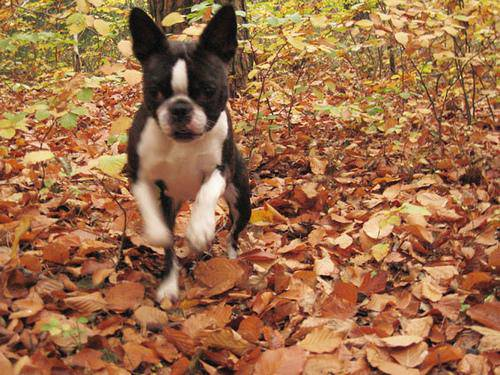

In [ ]:
from IPython.display import Image
Image(filename=filenames[0])

In [ ]:
labels_df["breed"][0]

'boston_bull'

In [ ]:
breeds = labels_df["breed"].to_numpy()
len(breeds)

10222

In [ ]:
breeds.shape

(10222,)

In [ ]:
unique_breeds = np.unique(breeds)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
type(breeds[0] == unique_breeds)

numpy.ndarray

In [ ]:
breeds[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_breed = []
count = 0
for breed in breeds:
  arr = breed == unique_breeds
  boolean_breed.append(arr)
  count = count + 1
boolean_breed[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(breeds[0])
print(np.where(unique_breeds == breeds[0]))
print(boolean_breed[0].argmax())
print(boolean_breed[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X = filenames
y = boolean_breed
len(filenames)

10222

In [ ]:
 NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step: 1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES], 
                                                  test_size = 0.2, 
                                                  random_state = 42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[0][0][1]

137

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
## Data prep
IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels = 3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# Data batch prep
def get_image_label (image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
type(get_image_label(X[42], tf.constant(y[42])))

tuple

In [ ]:
process_image(X[42]), tf.constant(y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

def create_data_batches (X, y = None, batch_size= BATCH_SIZE, valid_data = False, test_data = False):
  if test_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  ##if our data is valid set
  elif valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                              tf.constant(y))) 
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
y[0].argmax()

19

In [ ]:
import matplotlib.pyplot as plt
def show_25_images (images, labels):
  plt.figure(figsize = (12, 12))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
# deconstructing batches
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.57743216, 0.7303733 , 0.8549532 ],
          [0.54747903, 0.6919818 , 0.8008404 ],
          [0.5321495 , 0.65732455, 0.7387321 ],
          ...,
          [0.53831446, 0.56576544, 0.5343929 ],
          [0.52075934, 0.584695  , 0.54096246],
          [0.5353905 , 0.6059787 , 0.5589199 ]],
 
         [[0.57857144, 0.7315126 , 0.8560925 ],
          [0.5499069 , 0.6944097 , 0.8032683 ],
          [0.53525037, 0.6604254 , 0.741833  ],
          ...,
          [0.531621  , 0.55907196, 0.5276994 ],
          [0.5202358 , 0.5760187 , 0.53514856],
          [0.5284617 , 0.59332514, 0.5491287 ]],
 
         [[0.57824546, 0.73288476, 0.85596365],
          [0.55459803, 0.6999538 , 0.8063065 ],
          [0.537542  , 0.67353636, 0.7513375 ],
          ...,
          [0.55149525, 0.57894623, 0.5475737 ],
          [0.5216936 , 0.5677784 , 0.5292829 ],
          [0.5207196 , 0.57085085, 0.53163517]],
 
         ...,
 
         [[0.6437965 , 0.5140562 , 0.38032612],
          [0.63484

In [ ]:
len(train_images), len(train_labels)

(32, 32)

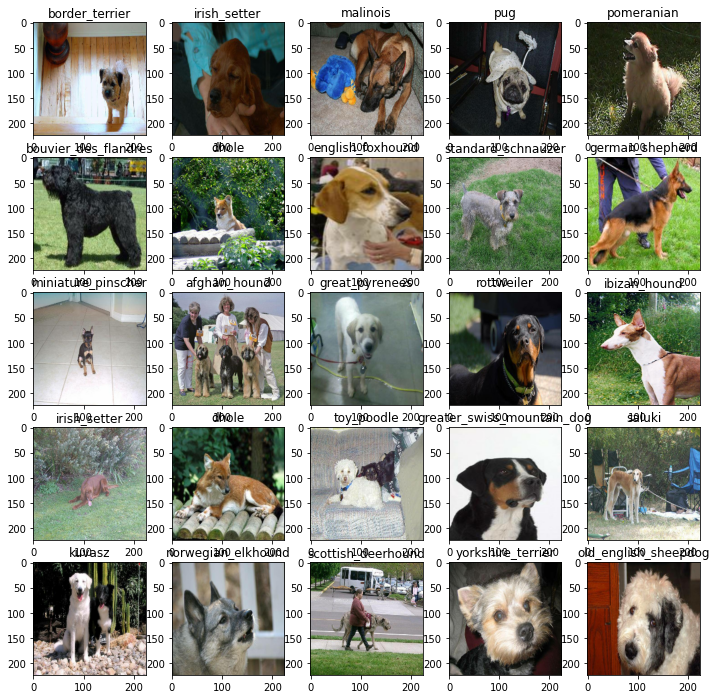

In [ ]:
##visualise the data 
show_25_images(train_images, train_labels)

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images, val_labels

(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

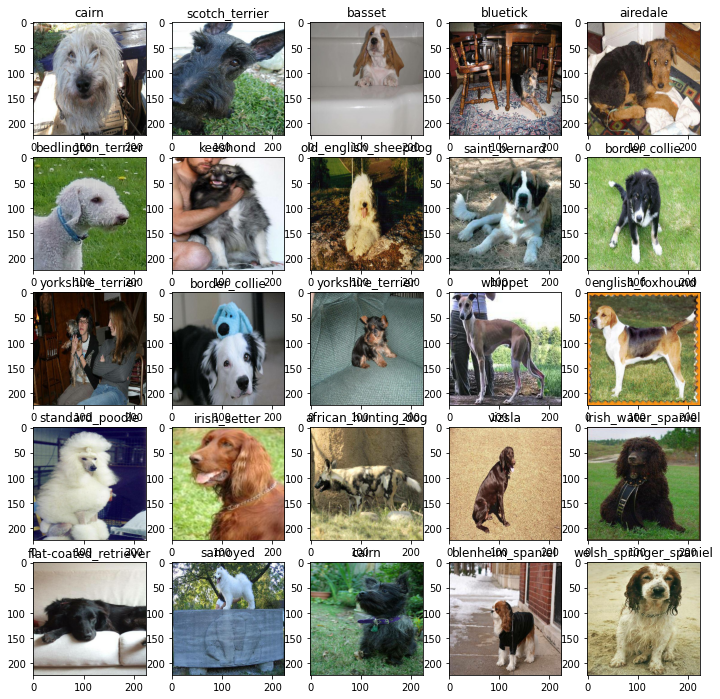

In [ ]:
show_25_images(val_images, val_labels)

In [ ]:
INPUT_SHAPE = [None, 224, 224, 3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation = "softmax")
  ])

  model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ["accuracy"])
  
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("/content/sample_data/Data_dog_vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider", min: 10, max: 100, step: 10}

In [ ]:
def train_model ():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq= 1,
            callbacks = [tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 77s 3s/step - loss: 4.6822 - accuracy: 0.1013 - val_loss: 3.4604 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 74s 3s/step - loss: 1.6931 - accuracy: 0.6775 - val_loss: 2.2205 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 71s 3s/step - loss: 0.5815 - accuracy: 0.9337 - val_loss: 1.7455 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 71s 3s/step - loss: 0.2565 - accuracy: 0.9937 - val_loss: 1.5466 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 69s 3s/step - loss: 0.1494 - accuracy: 0.9987 - val_loss: 1.4582 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 73s 3s/step - loss: 0.1024 - accuracy: 0.9987 - val_loss: 1.4187 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] - 69s 3s/step - loss: 0.0772 - accuracy: 1.0000 - val_loss: 1.3782 - val_accuracy: 0.6400
Epoch 8/100
2

In [ ]:
%tensorboard --logdir content/sample_data/Data_dog_vision/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 14s 2s/step


array([[2.41471361e-03, 1.43409090e-03, 2.84085586e-03, ...,
        1.09900685e-03, 1.71216423e-04, 1.93947495e-03],
       [3.82093276e-04, 2.47603079e-04, 2.35308725e-02, ...,
        4.38609306e-04, 1.28440815e-03, 2.57200416e-04],
       [1.02307895e-05, 9.23387197e-05, 7.87038152e-05, ...,
        9.20714010e-05, 2.14577794e-05, 1.30372110e-03],
       ...,
       [2.04334847e-05, 7.52878550e-05, 1.01259495e-04, ...,
        9.06740752e-06, 8.91721138e-05, 8.02844879e-05],
       [1.74476462e-03, 5.63837937e-04, 1.27376581e-04, ...,
        1.83616197e-04, 6.99384618e-05, 1.27671687e-02],
       [5.65872237e-04, 2.55183404e-05, 1.90047733e-03, ...,
        3.28419870e-03, 4.04626480e-04, 2.89855758e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
index = 22
print(f"prob array : {predictions[index]}")
print(f"max prob value in array : {np.max(predictions[index])}")
print(f"index of max prob: {np.argmax(predictions[index])}")
print(f"breed : {unique_breeds[np.argmax(predictions[index])]}")

prob array : [1.84239104e-01 6.32772499e-05 2.23025098e-04 5.16865020e-06
 4.18771902e-04 3.31212163e-06 1.43619231e-03 4.11732908e-05
 3.35924036e-04 1.99916303e-05 9.35473290e-05 2.68292119e-04
 2.75571583e-05 4.57622169e-04 9.87106796e-06 1.37375318e-04
 3.33625183e-04 3.65160429e-03 5.31942305e-06 6.19939747e-05
 2.23994328e-04 6.42524610e-05 9.87309759e-05 1.77227979e-04
 3.33070755e-04 1.57686954e-04 3.81729364e-01 4.73019638e-04
 2.01034459e-06 8.34335442e-05 1.37398310e-04 6.00706298e-05
 1.56464826e-04 2.76074616e-06 1.83285829e-05 5.72095341e-05
 5.84860936e-06 6.23495362e-05 1.01241758e-05 7.73286501e-07
 3.08158487e-05 9.52058417e-06 1.36263097e-05 3.83967636e-05
 9.21229221e-05 2.52385624e-04 1.00836769e-05 1.58100665e-05
 8.71879674e-05 5.29292993e-05 1.78224673e-05 3.63090439e-05
 2.90119192e-06 1.71445226e-05 2.74315622e-04 1.26731675e-05
 7.57585576e-06 1.92311374e-04 4.76096902e-05 3.68342357e-04
 3.54830525e-04 1.02558424e-05 1.26783838e-04 6.39040663e-05
 2.14788201

In [ ]:
def get_pred_labels(prediction_probablities):
  return unique_breeds[np.argmax(prediction_probablities)]
pred_label = get_pred_labels(predictions[0])
pred_label

'irish_wolfhound'

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify (data):
  images_i = []
  labels_l = []
  for image, label in data.unbatch().as_numpy_iterator():
    images_i.append(image)
    labels_l.append(unique_breeds[np.argmax(label)])

  return images_i, labels_l

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_labels(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_labels(predictions[0])

'irish_wolfhound'

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_labels(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{}, {:2.0f}%, {}".format(pred_label, np.max(pred_prob)*100, true_label), color = color)

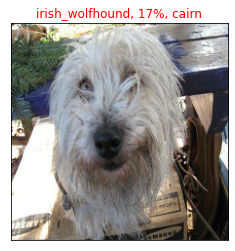

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images, n=0)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_labels(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values= pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels = top_10_pred_labels, rotation = "vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

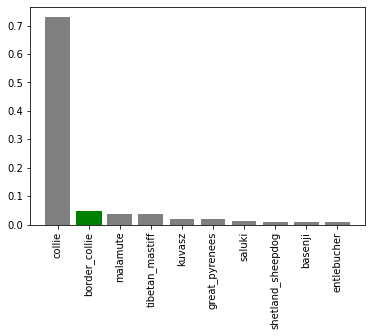

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.17141183, 0.1467397 , 0.10761588, 0.08229386, 0.07171397,
       0.05350423, 0.05234072, 0.04095562, 0.03149193, 0.02934864],
      dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['irish_wolfhound', 'silky_terrier', 'soft-coated_wheaten_terrier',
       'tibetan_terrier', 'border_terrier', 'cairn', 'komondor',
       'australian_terrier', 'miniature_schnauzer', 'standard_schnauzer'],
      dtype=object)

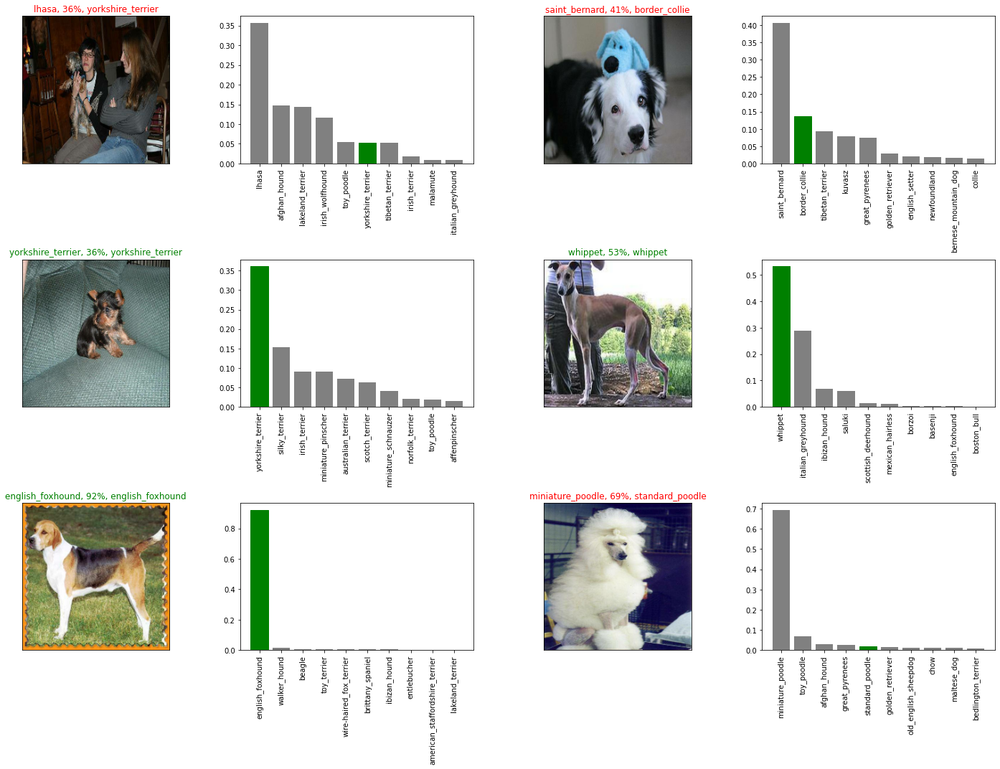

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5* num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels= val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad= 1.0)
plt.show()

In [ ]:
num_images

6

In [ ]:
def save_model(model, suffix = None):
  modeldir = os.path.join("/content/sample_data/Data_dog_vision/model", datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"saving mode to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
 def load_model(model_path):
   model = tf.keras.models.load_model(model_path, custom_objects = {"KerasLayer": hub.KerasLayer})
   return model

In [ ]:
save_model(model, suffix = "1000-images-mobilenetv2-adam")

saving mode to: /content/sample_data/Data_dog_vision/model/20230313-18271678732020-1000-images-mobilenetv2-adam.h5...


'/content/sample_data/Data_dog_vision/model/20230313-18271678732020-1000-images-mobilenetv2-adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/sample_data/Data_dog_vision/model/20230313-18271678732020-1000-images-mobilenetv2-adam.h5")

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 11s 2s/step - loss: 1.2711 - accuracy: 0.6500


[1.2710932493209839, 0.6499999761581421]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 19s 3s/step - loss: 1.2711 - accuracy: 0.6500


[1.2710932493209839, 0.6499999761581421]

In [ ]:
 ## trainig full model 

 len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X, y)

In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

In [ ]:
full_model_tensorboard = create_tensorboard_callback()

In [ ]:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy", patience = 3)

In [ ]:
 #full_model.fit(x = full_data, epochs = NUM_EPOCHS,
                #callbacks = [full_model_tensorboard, full_model_early_stopping])

In [ ]:
 save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

saving mode to: /content/sample_data/Data_dog_vision/model/20230313-19331678735980-full-image-set-mobilenetv2-Adam.h5...


'/content/sample_data/Data_dog_vision/model/20230313-19331678735980-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/sample_data/Data_dog_vision/model/20230313-19331678735980-full-image-set-mobilenetv2-Adam.h5")

In [ ]:
 ## making predictios on test data
 test_path = "/content/sample_data/Data_dog_vision/test/"
 test_filenames = [test_path + fname for fname in os.listdir(test_path)]
 test_filenames[:10]

['/content/sample_data/Data_dog_vision/test/f863758735a6cc504d4a80477591eaf6.jpg',
 '/content/sample_data/Data_dog_vision/test/e9d585ce5dc29b4e9aa6a7332ddfa983.jpg',
 '/content/sample_data/Data_dog_vision/test/463ea795a90896d8739d36794a6a57fb.jpg',
 '/content/sample_data/Data_dog_vision/test/08dc47beafdfdc5702dbf168c7eb3456.jpg',
 '/content/sample_data/Data_dog_vision/test/f8017854f9f52f53140234f44cd335f8.jpg',
 '/content/sample_data/Data_dog_vision/test/6025e31516e0a0ae5282eb190c8ac22c.jpg',
 '/content/sample_data/Data_dog_vision/test/e89317cab9060dcaa19f1b669d363223.jpg',
 '/content/sample_data/Data_dog_vision/test/2a0307a3c61935caff2e6278182a249c.jpg',
 '/content/sample_data/Data_dog_vision/test/d1013cd32793410daad99222dfb6e3e6.jpg',
 '/content/sample_data/Data_dog_vision/test/9e101042bb00a2b1796d936c9c282ace.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data = True)

In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 653s 2s/step


In [ ]:
np.savetxt("/content/sample_data/Data_dog_vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
test_predictions = np.loadtxt("/content/sample_data/Data_dog_vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f863758735a6cc504d4a80477591eaf6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e9d585ce5dc29b4e9aa6a7332ddfa983,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,463ea795a90896d8739d36794a6a57fb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,08dc47beafdfdc5702dbf168c7eb3456,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f8017854f9f52f53140234f44cd335f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f863758735a6cc504d4a80477591eaf6,1.365540e-06,1.168710e-06,1.938490e-08,2.188778e-06,1.296419e-07,4.862536e-08,3.812083e-06,4.645847e-06,8.226109e-08,...,1.071971e-06,7.556117e-05,1.433963e-06,2.863721e-05,3.594070e-08,5.054384e-07,7.616147e-06,1.633447e-05,9.946700e-01,1.025695e-05
1,e9d585ce5dc29b4e9aa6a7332ddfa983,4.099757e-07,7.123365e-06,7.676520e-08,3.753547e-07,5.952541e-05,3.154346e-06,1.306252e-06,5.347886e-07,4.908781e-06,...,3.151532e-06,3.177825e-06,7.746722e-03,1.156533e-06,5.018885e-01,4.036775e-08,3.195996e-08,1.206988e-03,1.694390e-06,4.023345e-05
2,463ea795a90896d8739d36794a6a57fb,4.412908e-06,1.274826e-06,1.065324e-06,1.633503e-07,8.923403e-06,5.521106e-07,2.145134e-05,1.124581e-06,4.441557e-05,...,2.967090e-05,4.582147e-06,4.057001e-07,6.553553e-06,4.458633e-06,2.849795e-07,4.883591e-03,7.854504e-06,9.457676e-06,3.626685e-06
3,08dc47beafdfdc5702dbf168c7eb3456,3.385968e-05,3.208167e-08,1.023329e-07,1.193172e-07,4.974213e-07,3.571028e-06,3.368587e-08,4.261292e-07,1.187250e-07,...,2.073897e-07,4.269783e-07,1.784918e-07,7.910297e-08,1.200098e-06,8.218448e-07,3.262581e-08,2.953156e-07,1.193531e-08,6.107677e-07
4,f8017854f9f52f53140234f44cd335f8,1.439102e-08,6.691810e-08,1.848237e-07,9.951842e-08,3.800922e-04,1.721341e-06,2.305359e-06,3.134850e-05,4.152595e-06,...,7.625687e-08,7.296676e-08,1.044001e-05,1.251419e-05,2.174569e-06,3.801733e-07,2.293886e-08,1.564490e-05,3.564040e-08,2.798257e-07


In [ ]:
preds_df.to_csv("/content/sample_data/Data_dog_vision/full-model-predictions-set-mobilenetv2.csv", index = False)